In [1]:
from keras.applications import VGG16
from keras.models import Model
from keras.layers import AveragePooling2D, Input
import keras.backend as K
from vaiutils import path_consts, plot_images, plot_image
from scipy.misc import imread, imresize
from scipy.ndimage import gaussian_filter
from tqdm import tqdm_notebook

Using TensorFlow backend.


In [2]:
for k, v in path_consts('StyleTransfer-Keras', 'Sample-Images'):
    exec(k + '=v')

In [5]:
K.clear_session()
model = VGG16(include_top=False)

In [4]:
x = _input_layer = Input(shape=(None, None, 3))
for layer in vgg.layers[1:]:
    if 'pool' in layer.name:
        x = AveragePooling2D()(x)
    else:
        x = layer(x)
model = Model(_input_layer, x)
model.summary()

NameError: name 'vgg' is not defined

In [30]:
def preprocess_image(x):
    x[:, :, 0] -= 103.939
    x[:, :, 1] -= 116.779
    x[:, :, 2] -= 123.68
    return x[:, :, ::-1]

In [31]:
def postprocess_image(x):
    x = x[:, ::-1]
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    return x

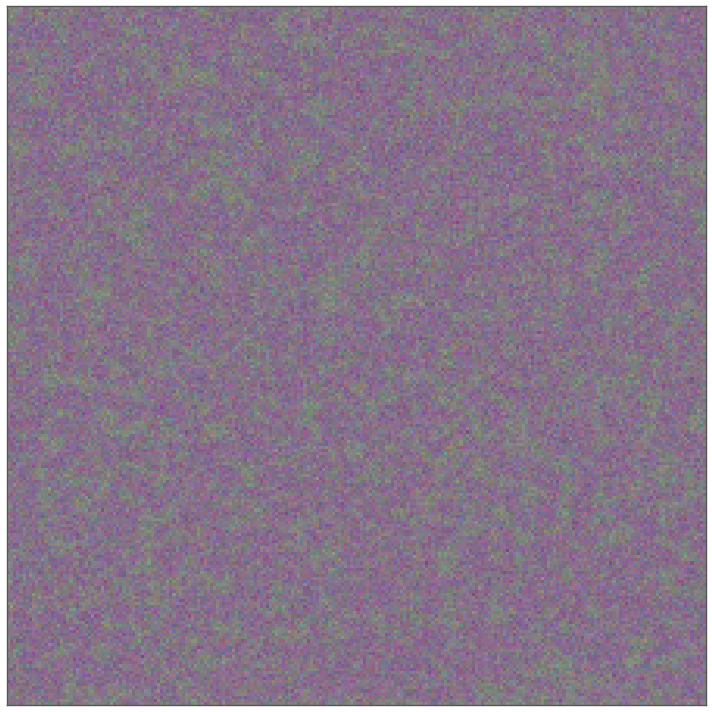

In [4]:
target_img = np.random.randn(224, 224, 3) * 10 + 128

input_img = model.input
layer_activations = model.layers[1].output[:, :, :, 8]
grads = K.gradients(K.mean(layer_activations), input_img)[0]
grads /= K.sqrt(K.mean(K.square(grads + 1e-10)))

iterate = K.function([input_img], [grads[0]])

for _ in tqdm_notebook(range(10)):
    g = iterate([np.stack([target_img])])[0]
    target_img += g

plot_image(target_img)

In [5]:
def recreate_content(image, layers=[0], iterations=10, lr=1):
    errors = K.variable(0.0)
    for layer in layers:
        content_extractor = Model(model.input, model.layers[layer].output)
        content_activations = content_extractor.predict(np.stack([image]))
        target_img = np.random.randn(224, 224, 3) * 10 + 128

        input_img = model.input
        layer_activations = model.layers[layer].output
        errors += K.mean(K.square(layer_activations - content_activations))

    grads = K.gradients(errors, input_img)[0]
    grads /= K.sqrt(K.mean(K.square(grads + 1e-10)))
    grads = K.clip(grads, -1, 1)

    iterate = K.function([input_img], [grads[0]])

    for _ in tqdm_notebook(range(iterations)):
        g = iterate([np.stack([target_img])])[0]
        target_img -= g * lr

    return target_img

In [56]:
content_img = imresize(imread(DIR_DATA + '/pigeon.jpg'),
                       (224, 224))

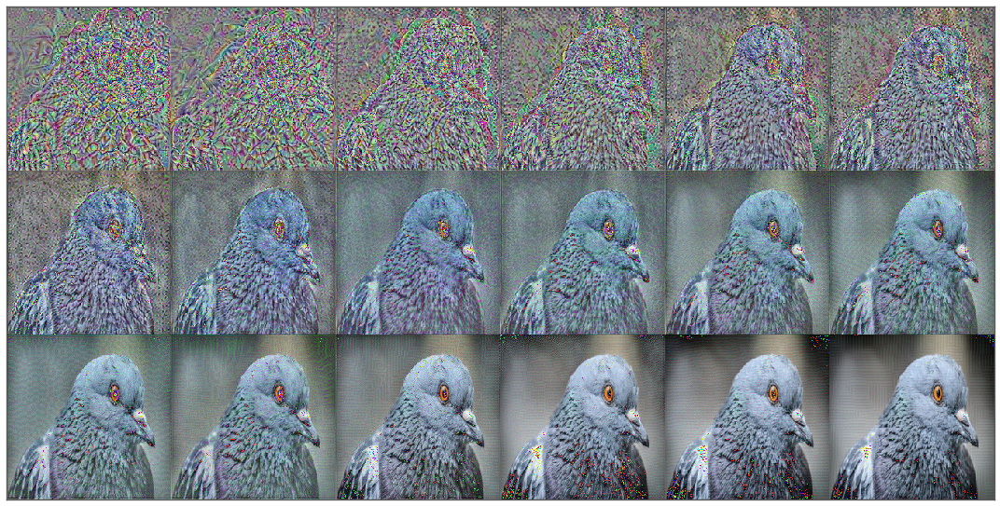

In [7]:
recreated_images = []
for i in tqdm_notebook(range(len(model.layers) - 1, 0, -1)):
    recreated_images.append(recreate_content(content_img, [i], 100, 10))

plot_images(np.stack(recreated_images))

In [129]:
recreated_images = []
for i in tqdm_notebook(range(len(model.layers) - 1, 1, -1)):
    recreated_images.append(recreate_content(
        content_img, range(1, i), 100, 10))
recreated_images.append(recreate_content(content_img, [1], 100, 10))
plot_images(np.stack(recreated_images))

UnboundLocalError: local variable 'input_img' referenced before assignment

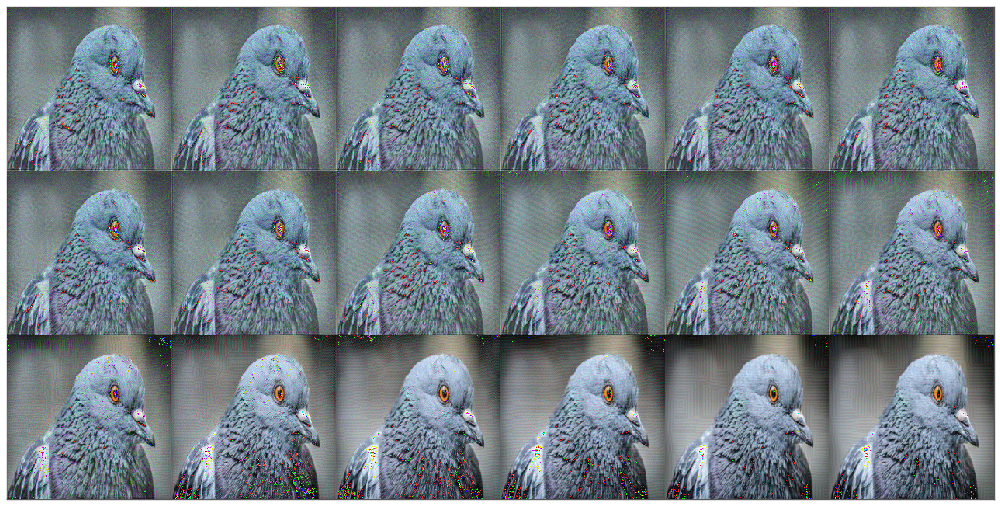

In [11]:
def gram_matrix(x):
    flat_x = K.batch_flatten(K.permute_dimensions(x[0], (2, 0, 1)))
    return K.dot(flat_x, K.transpose(flat_x))

In [16]:
def recreate_style(image, layers=[0], iterations=10, lr=1):
    errors = K.variable(0.0)
    target_img = np.random.randn(224, 224, 3) * 10 + 128
    for layer in layers:
        content_extractor = Model(model.input, model.layers[layer].output)
        content_activations = content_extractor.predict(np.stack([image]))

        input_img = model.input
        layer_activations = model.layers[layer].output
        errors += K.mean(K.square(gram_matrix(layer_activations) -
                                  gram_matrix(content_activations)))

    grads = K.gradients(errors, input_img)[0]
    grads /= K.sqrt(K.mean(K.square(grads + 1e-10)))
    grads = K.clip(grads, -1, 1)

    iterate = K.function([input_img], [grads[0]])

    for _ in tqdm_notebook(range(iterations)):
        g = iterate([np.stack([target_img])])[0]
        target_img -= g * lr

    return target_img

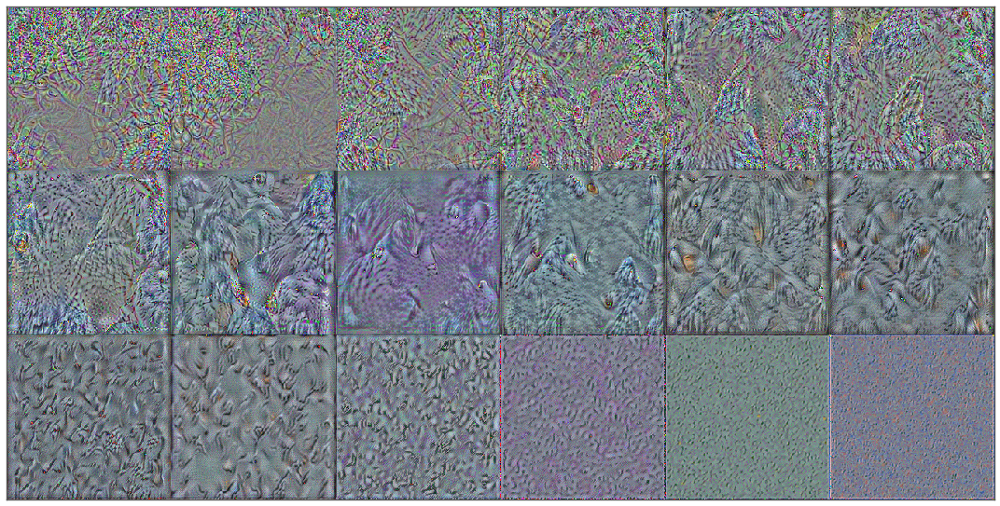

In [136]:
recreated_images = []
for i in tqdm_notebook(range(len(model.layers) - 1, 0, -1)):
    recreated_images.append(recreate_style(content_img, [i], 100, 10))

plot_images(np.stack(recreated_images))

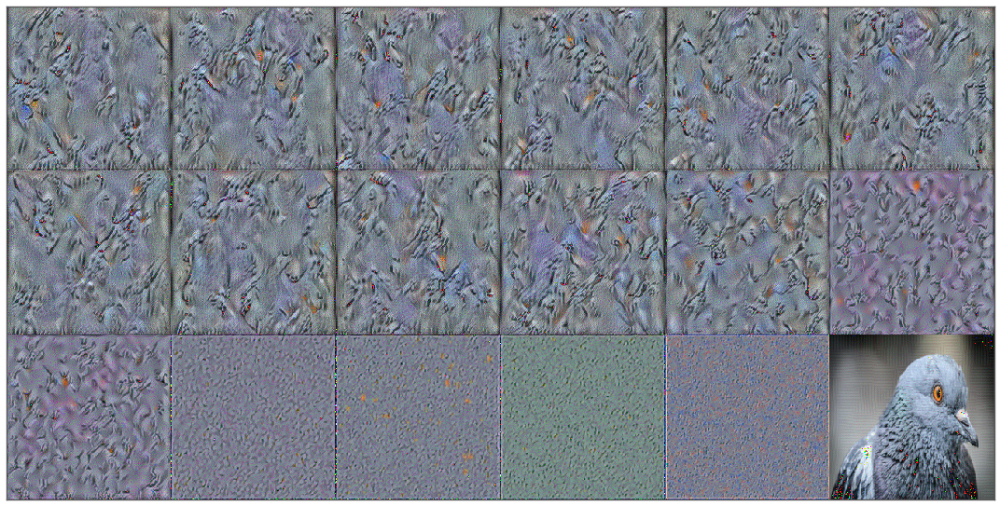

In [137]:
recreated_images = []
for i in tqdm_notebook(range(len(model.layers) - 1, 1, -1)):
    recreated_images.append(recreate_style(
        content_img, range(1, i), 100, 10))
recreated_images.append(recreate_content(content_img, [1], 100, 10))
plot_images(np.stack(recreated_images))

In [57]:
style_img = imresize(imread(DIR_DATA + '/starry-night.jpg'),
                     (224, 224))

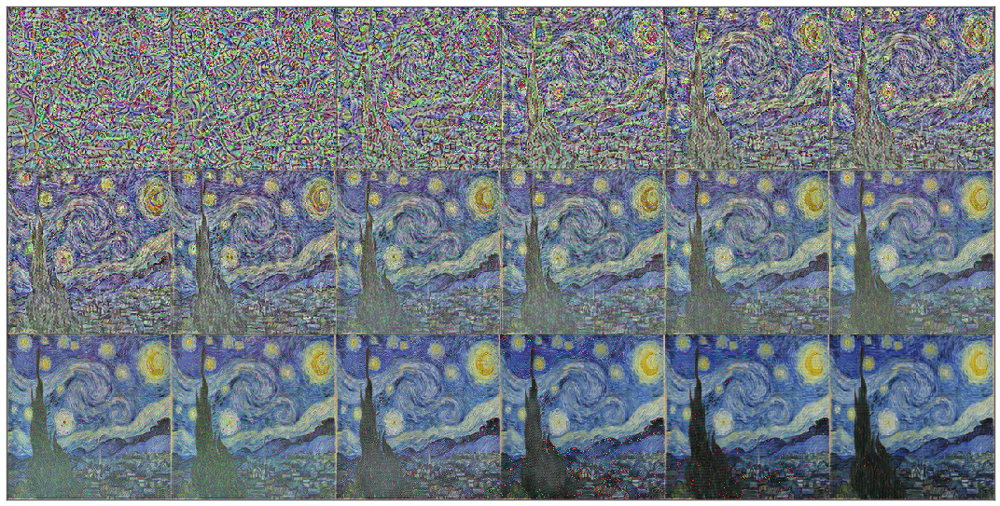

In [140]:
recreated_images = []
for i in tqdm_notebook(range(len(model.layers) - 1, 0, -1)):
    recreated_images.append(recreate_content(style_img, [i], 100, 10))

plot_images(np.stack(recreated_images))

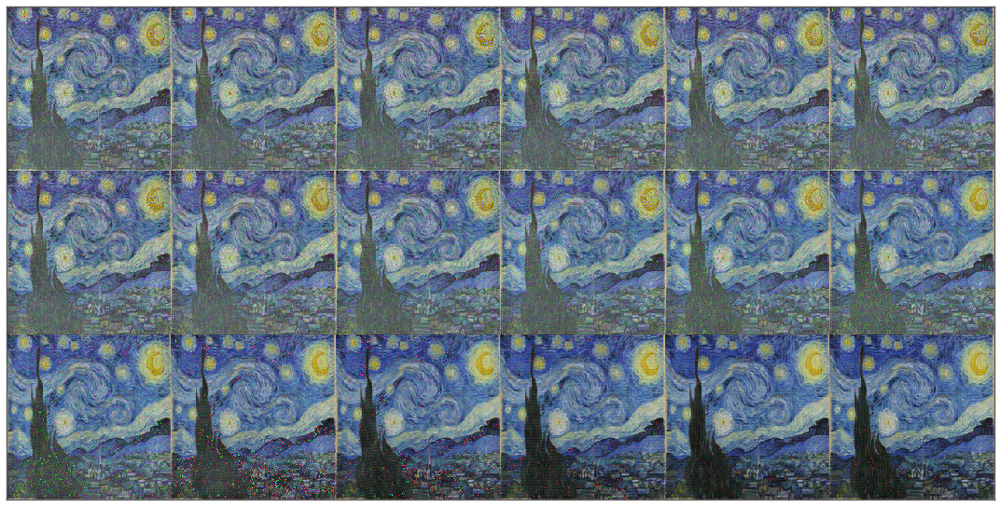

In [12]:
recreated_images = []
for i in tqdm_notebook(range(len(model.layers) - 1, 1, -1)):
    recreated_images.append(recreate_content(
        style_img, range(1, i), 100, 10))
recreated_images.append(recreate_content(style_img, [1], 100, 10))
plot_images(np.stack(recreated_images))

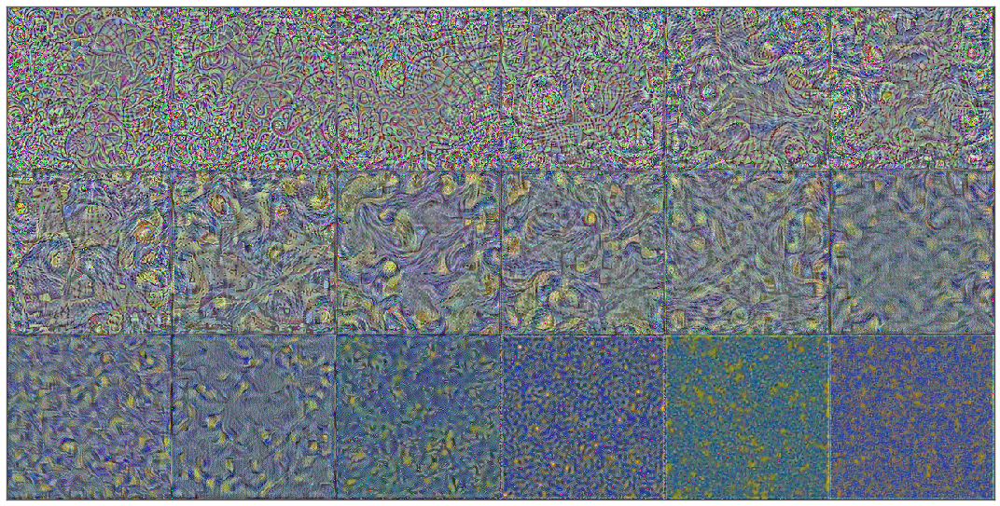

In [17]:
recreated_images = []
for i in tqdm_notebook(range(len(model.layers) - 1, 0, -1)):
    recreated_images.append(recreate_style(style_img, [i], 100, 10))

plot_images(np.stack(recreated_images))

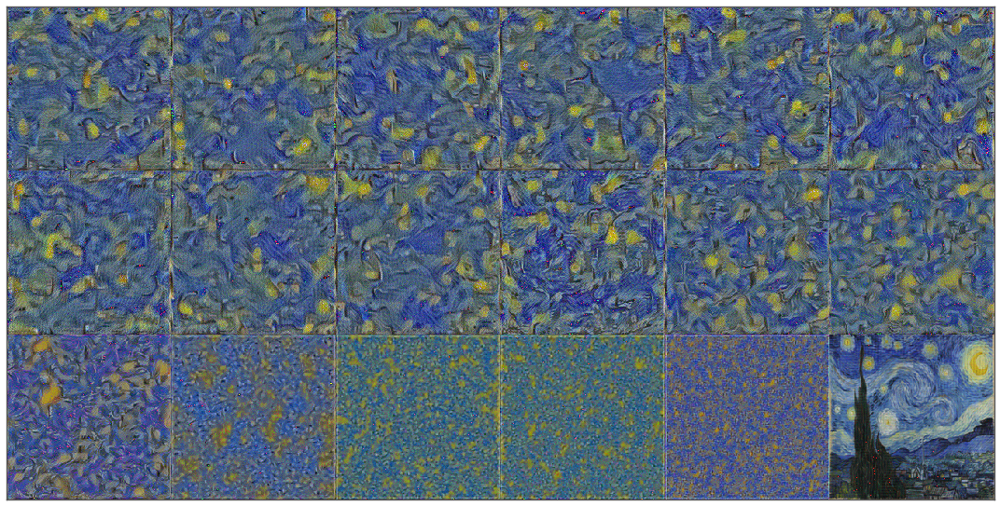

In [14]:
recreated_images = []
for i in tqdm_notebook(range(len(model.layers) - 1, 1, -1)):
    recreated_images.append(recreate_style(
        style_img, range(1, i), 100, 10))
recreated_images.append(recreate_content(style_img, [1], 100, 10))
plot_images(np.stack(recreated_images))

In [28]:
def transfer_style(content_image, style_image, content_ratio=0.5, layers=[1, 4, 7, 11, 15], iterations=80, lr=10):
    content_errors = K.variable(0.0)
    style_errors = K.variable(0.0)
    target_img = np.random.randn(224, 224, 3) * 10 + 128
    for layer in layers:
        content_extractor = Model(
            model.input, model.layers[layer].get_output_at(0))
        content_activations = content_extractor.predict(
            np.stack([gaussian_filter(content_image, rand() * 0.3)]))
        style_activations = content_extractor.predict(np.stack([style_image]))

        input_img = model.input
        layer_activations = model.layers[layer].get_output_at(0)
        content_errors += K.mean(K.square(layer_activations -
                                          content_activations))
        style_errors += K.mean(K.square(gram_matrix(layer_activations) -
                                        gram_matrix(style_activations)))

    grads_content = K.gradients(content_errors, input_img)[0]
    grads_content /= K.sqrt(K.mean(K.square(grads_content + 1e-10)))
    grads_content = K.clip(grads_content, -1, 1)
    grads_style = K.gradients(style_errors, input_img)[0]
    grads_style /= K.sqrt(K.mean(K.square(grads_style + 1e-10)))
    grads_style = K.clip(grads_style, -0.5, 0.5)

    grads = content_ratio * grads_content * \
        0.1 + (1 - content_ratio) * grads_style

    iterate = K.function([input_img], [grads[0]])

    for _ in tqdm_notebook(range(iterations)):
        g = iterate([np.stack([target_img])])[0]
        target_img -= g * lr

    return target_img

In [33]:
content_img = imresize(imread(DIR_DATA + '/federer.jpg'),
                       (224, 224))
style_img = imresize(imread(DIR_DATA + '/lion.jpg'),
                     (224, 224))

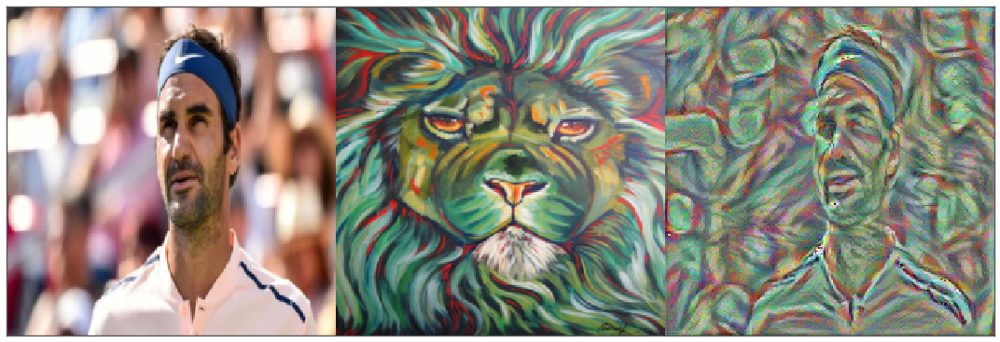

In [37]:
plot_images(np.stack([content_img, style_img,
                      transfer_style(content_img, style_img, 0.8)]))